<a href="https://colab.research.google.com/github/LanqingDu/UnstructuredDataAnalytics/blob/main/11_GeoSpatial_Analysis.ipynb" target="_blank">
<img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# **Geospatial Analysis**



> **Instructor:** Dr. Lanqing Du  
> **Acknowledgement:** This notebook referenced to R user guide content and Machine Learning resoures.  
> **Objective:** Introduction to GeoSpatial Analysis using R.
> **Instructions:** You can preview the **Table of Contents** from the side bar.

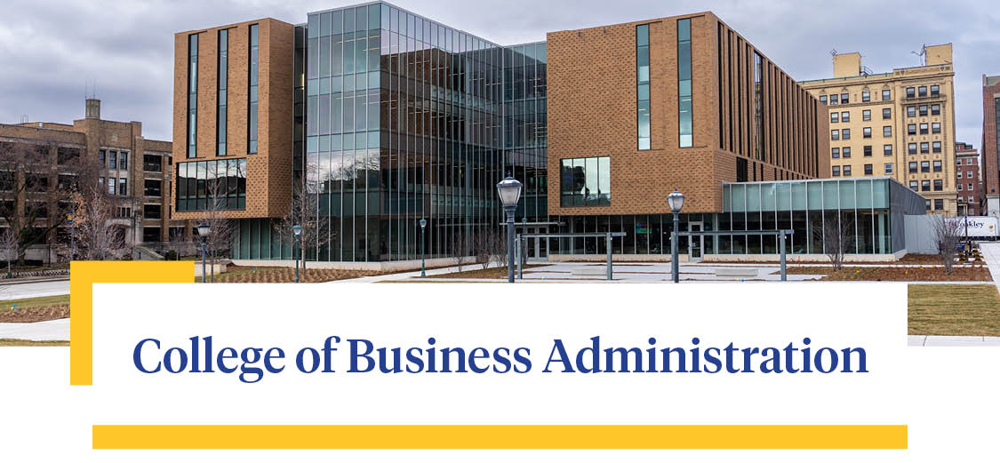
---

## [1. Intro and Objective](#obj)

* In Section we start to work with **Shapefile Data** in R
In this section, we demonstrate how to work with shapefile data in R. Specifically, we obtain a shapefile of municipal boundaries from the [St. Louis County Open Data Portal](https://http://data.stlouisco.com/datasets/2273a9e78bae4b94a2a1e6bf67e375e1_6)) by uploading the zip file to the google colab.

* In Section 3, we perform some advanced geospatial analysis using **API**s.
In this section, we perform advanced geospatial analysis by accessing semi-structured spatial data through API calls. We illustrate how to integrate and visualize data using both the Stadia Maps API and the Google Maps API within R.



## [2. Intro to GeoSpatial Analaysis](#Intro)

In this example, we show how to work with shapefile data within R. We obtain a shapefile of [municipal boundaries](http://data.stlouisco.com/). (In particular, we are using the [files](http://data.stlouisco.com/datasets/2273a9e78bae4b94a2a1e6bf67e375e1_6)

In [1]:
# ========================================================
# Step 1-1: Download and include the data library
# ========================================================
install.packages("dplyr")
install.packages("data.table")
install.packages("ggplot2") # Data Visualization
install.packages("ggthemes") # Extended Plot Themes for ggplot2
install.packages("sf") # Load the modern spatial analysis package


library(dplyr)
library(data.table)
library(ggplot2)
library(ggthemes)
library(sf)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘proxy’, ‘e1071’, ‘wk’, ‘classInt’, ‘s2’, ‘units’



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last


Linking to GEOS 3.12.1, GDAL 3.8.4, PROJ 9.3.1; sf_use_s2() is TRUE



### 2.1 Include and examine the shapefile

* Use shapefile path to load the shapefile

* The traditional “shape of your data” commands give some inkling to what things look like. One difference from working with simple data frames is the use of the “@” sign to access different slots in the SpatialPolygonsDataFrame. The “@data” slot stores a data frame associated with attribute data


In [3]:
# ============================================================
# Step 2 - 0: Upload the zip file and unzip the folder
# ============================================================

# unzip(zipfile, exdir = ".")
#   Function        : Extracts files from a ZIP archive to a specified directory.
#                     This function is used to decompress ZIP-compressed files,
#                     restoring their original contents (e.g., text files, shapefiles, CSVs).
#
#   zipfile         : Character string giving the name (and path, if applicable)
#                     of the ZIP file to be extracted.
#
#   exdir           : (Optional) Directory where the extracted files will be placed.
#                     Defaults to the current working directory ("."), but can be
#                     set to any folder path where the user wants the files unpacked.
#
#   Returns         : Invisibly returns a character vector of the names of the files
#                     extracted. The files themselves are written to the specified directory.
#--------------------------------------------------------------------------------
#   "Municipal_Boundaries.zip" : Specifies the ZIP archive containing the compressed files.
#                                This archive likely includes spatial or data files
#                                (e.g., shapefiles) related to municipal boundaries.
#
#   exdir = "Municipal_Boundaries" : Instructs R to extract the contents into a folder
#                                   named "Municipal_Boundaries". If this directory
#                                   does not already exist, R will create it.
#
#   Returns         : The contents of "Municipal_Boundaries.zip" are extracted into
#                     the "Municipal_Boundaries" folder, and a vector of file names
#                     (now unpacked) is returned invisibly.


unzip("Municipal_Boundaries.zip", exdir = "/content/Municipal_Boundaries")

In [4]:
# ============================================================
# Step 2 - 1: Read the shapefile
# ============================================================

# myShapefilePath <- "path/to/directory"
#   Function        : Assigns a file path (as a character string) to an R object.
#                     This is not a function call but a variable assignment using `<-`.
#                     The object typically stores a directory or file path for use
#                     in later operations (e.g., reading spatial data or CSV files).
#
#   path/to/directory : A character string specifying the absolute or relative
#                       location of the file or folder on the system.
#
#   Returns         : Stores the given path as a character vector in the variable.
#--------------------------------------------------------------------------------
#   myShapefilePath <- "/content/Municipal_Boundaries" :
#                      Assigns the full directory path "/content/Municipal_Boundaries"
#                      to the variable `myShapefilePath`.
#                      This path points to the folder where the municipal boundary
#                      shapefiles were extracted earlier.
#
#   Returns          : The object `myShapefilePath` now contains the string
#                      "/content/Municipal_Boundaries", which can be reused in
#                      subsequent functions (e.g., `st_read(myShapefilePath)`).

myShapefilePath<- "/content/Municipal_Boundaries"


# setwd(dir)
#   Function        : Sets the working directory for the current R session.
#                     The working directory is the default folder where R looks for files
#                     to read and where it saves output files unless otherwise specified.
#
#   dir             : A character string specifying the path to the desired working directory.
#                     This can be an absolute path (e.g., "/content/data") or a relative path.
#
#   Returns         : Invisibly returns the path of the new working directory.
#                     Subsequent file operations (e.g., read.csv, list.files, write.csv)
#                     will use this directory by default.
#--------------------------------------------------------------------------------
#   setwd(myShapefilePath) : Changes the current working directory to the path stored
#                            in the variable `myShapefilePath`, which is
#                            "/content/Municipal_Boundaries".
#
#   Effect           : After running this command, R will automatically look for and
#                      save files in the "Municipal_Boundaries" directory unless a
#                      different path is specified.
#
#   Returns          : Invisibly returns "/content/Municipal_Boundaries" as the
#                      active working directory.

setwd(myShapefilePath)
dir() # Files under MunicipalBoundaries (5 files)

# st_read(dsn, layer = NULL, ...)
#   Function        : Reads spatial vector data (e.g., shapefiles, GeoJSON, GeoPackage)
#                     into an R object of class "sf" (simple features).
#                     It is part of the 'sf' package, which provides tools for
#                     handling spatial data in a tidy and efficient way.
#
#   dsn             : Data Source Name — a character string specifying the path to the
#                     data source. This is typically a folder containing shapefiles or
#                     a specific file (e.g., .gpkg, .geojson).
#
#   layer           : (Optional) The name of the spatial layer to read.
#                     For shapefiles, this corresponds to the base name of the file
#                     (without the .shp extension). If omitted, `st_read` will try
#                     to auto-detect the layer.
#
#   ...             : Additional arguments passed to control how the data are read,
#                     such as `quiet = TRUE` to suppress messages.
#
#   Returns         : An object of class "sf" (simple features) representing spatial data.
#                     This includes geometry columns (e.g., polygons, lines, points)
#                     and attribute data stored as a data frame.
#--------------------------------------------------------------------------------
#   dsn = myShapefilePath :
#          Specifies the directory path ("/content/Municipal_Boundaries")
#          where the shapefile is located. This tells R where to look for the data source.
#
#   layer = "Municipal_Boundaries" :
#          Indicates the specific shapefile (without the .shp extension) to read
#          from the directory. In this case, it loads the layer "Municipal_Boundaries.shp".
#
#   Returns          : The object `stlco` becomes an "sf" data frame containing:
#                      - The geometries (e.g., polygons outlining municipal boundaries)
#                      - The associated attribute data (e.g., names, area codes)
#                      This object can be visualized, mapped, or analyzed using
#                      functions from the 'sf' or 'ggplot2' packages.


stlco <- st_read(dsn = myShapefilePath, layer = "Municipal_Boundaries")

[1] "Municipal_Boundaries.cpg" "Municipal_Boundaries.dbf"
[3] "Municipal_Boundaries.prj" "Municipal_Boundaries.shp"
[5] "Municipal_Boundaries.shx"

Reading layer `Municipal_Boundaries' from data source 
  `/content/Municipal_Boundaries' using driver `ESRI Shapefile'
Simple feature collection with 129 features and 6 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 752590.9 ymin: 930073.6 xmax: 929153.3 ymax: 1113612
Projected CRS: NAD_1983_StatePlane_Missouri_East_FIPS_2401_Feet


In [5]:
# ============================================================
# Step 2 - 2: Examine the shapefile
# ============================================================

# Display summary information
summary(stlco)

# st_geometry(stlco)     : Extracts all spatial geometries (e.g., polygons) from the
#                            `stlco` object, which represents municipal boundaries.
#
# st_geometry(stlco)[[1]]: Selects the first geometry — typically the first municipality's
#                            boundary polygon.
#
# st_coordinates(...)    : Converts that single geometry into a coordinate matrix showing
#                            each vertex of the polygon (e.g., longitude and latitude values).

# Coordinates of the first feature (using st_geometry() and st_coordinates())
head(st_coordinates(st_geometry(stlco)[[1]]))

# get the col names
# names(stlco)

# Check projection information (CRS)
# st_crs(stlco)

    OBJECTID    MUNICIPALI            MUNI             MUNICODE        
 Min.   :  1   Length:129         Length:129         Length:129        
 1st Qu.: 33   Class :character   Class :character   Class :character  
 Median : 65   Mode  :character   Mode  :character   Mode  :character  
 Mean   : 65                                                           
 3rd Qu.: 97                                                           
 Max.   :129                                                           
                                                                       
    SQ_MILES           last_edite                  geometry  
 Min.   : 0.000263   Min.   :2020-11-09   MULTIPOLYGON :129  
 1st Qu.: 0.124843   1st Qu.:2020-11-09   epsg:NA      :  0  
 Median : 0.773264   Median :2020-11-09   +proj=tmer...:  0  
 Mean   : 4.422274   Mean   :2021-03-06                      
 3rd Qu.: 4.290047   3rd Qu.:2021-02-02                      
 Max.   :93.114647   Max.   :2023-02-01             

X,Y,L1,L2,L3
878523.2,1051090,1,1,1
878524.4,1051088,1,1,1
878531.8,1051075,1,1,1
878656.5,1050864,1,1,1
878690.4,1050807,1,1,1
878689.9,1050807,1,1,1


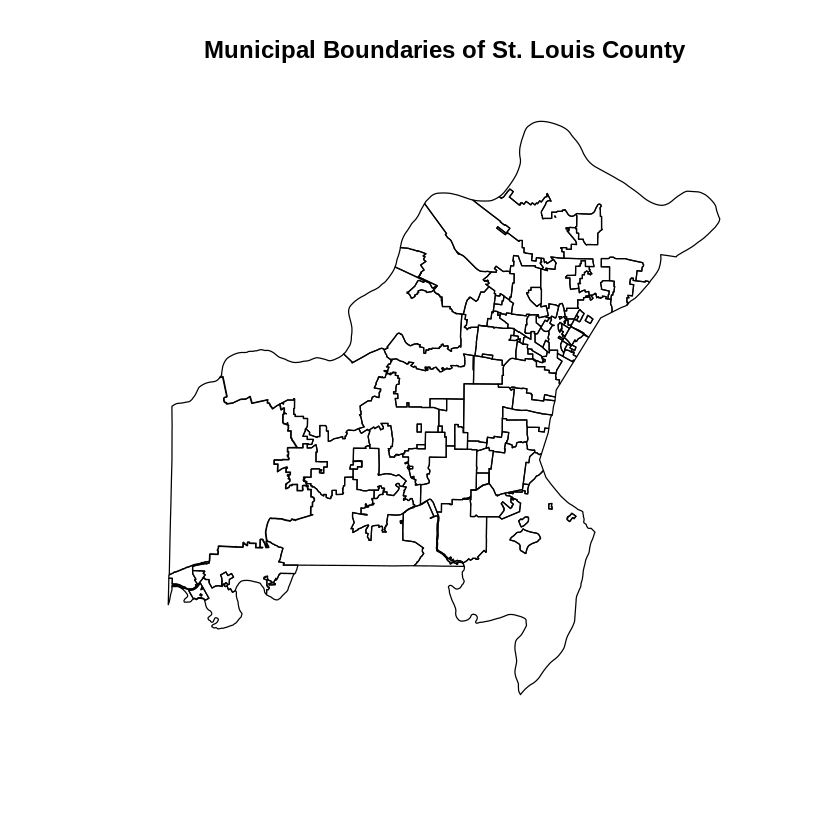

In [6]:
# ============================================================
# Step 2 - 3: Visualizations
# ============================================================

# Plot the coordinates of the first feature
# plot(st_coordinates(st_geometry(stlco)[[1]]))

# st_geometry(x)
#   Function        : Extracts or sets the geometry component from an "sf" (simple features) object.
#                     In an sf data frame, spatial and attribute data are stored together—
#                     `st_geometry()` isolates the geometric part (points, lines, or polygons)
#                     for further spatial operations or visualization.
#
#   x               : An object of class "sf" (simple features).
#                     This object contains both geometry (spatial features)
#                     and non-spatial attributes (e.g., IDs, names, metadata).
#
#   Returns         : An object of class "sfc" (simple feature column) — a list-like vector
#                     containing the geometry elements for each feature in `x`.
#                     Each element corresponds to a feature’s shape (e.g., one polygon per municipality).
#--------------------------------------------------------------------------------
#   st_geometry(stlco) :
#                      Extracts the geometry component from the spatial object `stlco`,
#                      which was previously read from the "Municipal_Boundaries" shapefile.
#                      The result is an "sfc" object containing all municipal boundary geometries,
#                      typically polygons.
#
#   Returns          : A list-like object where each entry represents the boundary shape
#                      (polygon) of a municipality. This geometry can be inspected, plotted,
#                      or manipulated independently of the associated attribute data.

# plots the map of St. Louis County Municipal boundaries
plot(st_geometry(stlco), main = "Municipal Boundaries of St. Louis County")


In [7]:
# ============================================================
# Step 2 - 4: Define as a variable
# ============================================================

# st_crs(x)
#   Function        : Retrieves or assigns the **Coordinate Reference System (CRS)**
#                     of a spatial object in the **sf** package.
#                     The CRS defines how 2D coordinate data correspond to positions
#                     on the Earth's surface — essential for ensuring spatial layers
#                     align correctly.
#
#   x               : An object of class "sf", "sfc", or "sfg" — typically containing
#                     spatial geometries like polygons, points, or lines.
#
#   Returns         : An object of class "crs" that includes:
#                       - **EPSG code** (e.g., 4326 for WGS84)
#                       - **proj4string** or **WKT** text describing the projection
#                     If no CRS is assigned, it returns `NA`.
#
#   You can also use:
#       st_crs(x) <- 4326
#     to set or change the CRS.
#--------------------------------------------------------------------------------
#   st_crs(stlco) :
#                   Retrieves the coordinate reference system of the `stlco` object,
#                   which represents the municipal boundaries previously read from
#                   a shapefile.
#
#   Returns          : A "crs" object describing the spatial projection of `stlco`.
#                      For example:
#                        - `EPSG:4326` → geographic coordinates (longitude/latitude)
#                        - `EPSG:26915` → NAD83 / UTM zone 15N
#                      This information is crucial for coordinate transformation
#                      (via `st_transform()`) or aligning multiple spatial datasets.

# If you want to store the CRS for later operations
stlcoCRS <- st_crs(stlco)


### 2.2 Exploratory data analysis

In [8]:
# ============================================================
# Step 2 - 5: Filter by municipality names
# ============================================================


dim(stlco)
named_municipalities <- stlco %>% filter(MUNI != "UNI") # Filter for municipalities that are not "UNI"
dim(named_municipalities)

[1] 129   7

[1] 90  7

In [9]:
# ============================================================
# Step 2 - 6: Statistics
# ============================================================

summary(named_municipalities$SQ_MILES)

# cause we have null value in named_municipalities$SQ_MILES
mean(named_municipalities$SQ_MILES)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max.     NA's 
 0.03122  0.34104  0.98690  4.04007  4.35441 67.20598        1 

[1] NA

In [10]:
# ============================================================
# Step 2 - 6: Filter by municipality miles
# ============================================================

named_large_municipalities <- named_municipalities %>% filter(SQ_MILES >= 50)
mean(named_municipalities %>% filter(SQ_MILES < 50) %>% pull(SQ_MILES))

[1] 3.322281

integer(0)

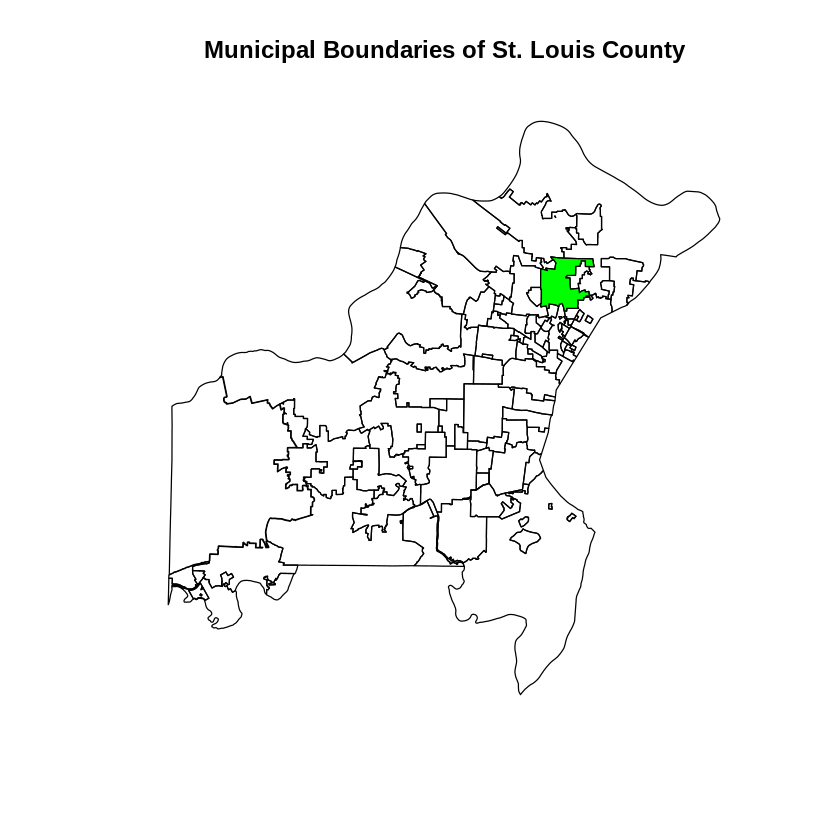

In [11]:
# ============================================================
# Step 2 - 7: Visualization with specific municipality highlighted
# ============================================================

# Overlay the specific municipality (FERGUSON) in green
ferguson <- stlco %>%
  filter(MUNICIPALI == "FERGUSON")

plot(st_geometry(stlco), main = "Municipal Boundaries of St. Louis County") +
  plot(st_geometry(ferguson), col = "green", add = TRUE)

### 2.3 Compute centroild of municipality
The centroid or center of mass is one way to represent the “middle” of a given polygon

In [12]:
# ============================================================
# Step 2 - 8: Calculate the centroid
# ============================================================

# Calculate and display the centroid of Ferguson
ferg_cent <- st_centroid(stlco %>% filter(MUNICIPALI == "FERGUSON"))
print(ferg_cent)  # Display as plain text output

Warning message:
“st_centroid assumes attributes are constant over geometries”


Simple feature collection with 1 feature and 6 fields
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: 878670.8 ymin: 1061600 xmax: 878670.8 ymax: 1061600
Projected CRS: NAD_1983_StatePlane_Missouri_East_FIPS_2401_Feet
  OBJECTID MUNICIPALI MUNI MUNICODE SQ_MILES last_edite
1       81   FERGUSON  FER      022 6.159777 2020-11-09
                  geometry
1 POINT (878670.8 1061600)


integer(0)

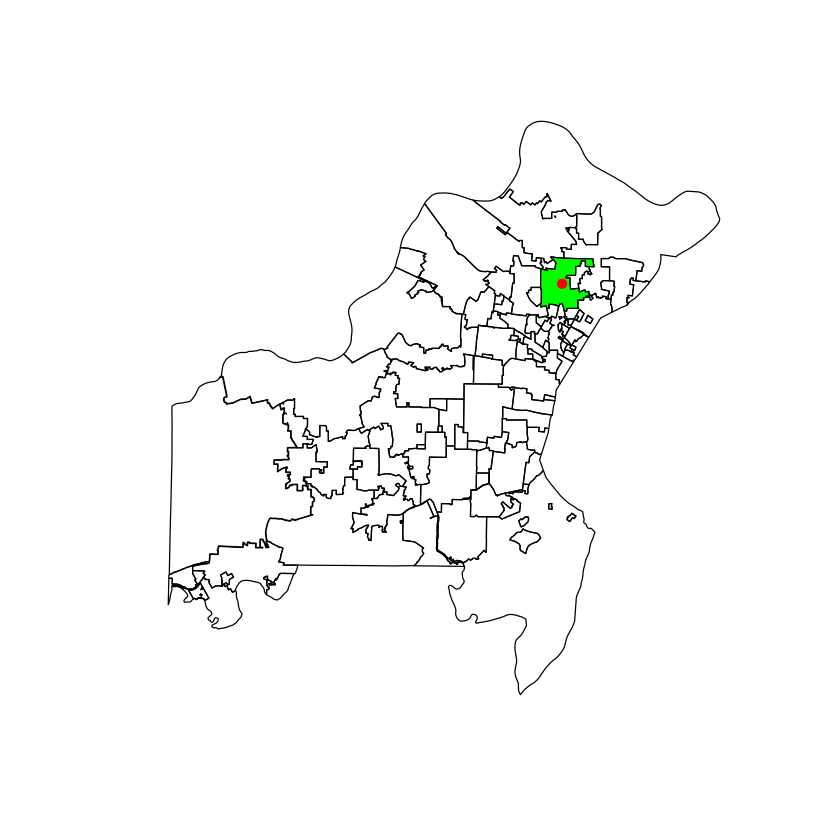

In [13]:
# ============================================================
# Step 2 - 9: Plot with centroid
# ============================================================

plot(st_geometry(stlco)) +
  plot(st_geometry(stlco %>% filter(MUNICIPALI == "FERGUSON")), col = "green", add = TRUE) +
  plot(st_geometry(ferg_cent), col = "red", pch = 19, add = TRUE)

### 2.4 Compute a buffer
* A buffer is a region that extends a spatial object outward by a given distance. A buffer around a point is a circle centered at that point.

* A buffer of a street centerline is a strip of land that could include the shoulder, the median, and sidewalk running parallel to the road.

* A buffer of a state could include all regions within 10 miles of that state’s border.

* We note here that the data from St. Louis County was delivered in geographic coordinates, not projected coordinates.

* This means that we have latitude and longitude data that is inherently 3D. We will need to project this in order to compute a buffer.

* We will first try to only project the centroid, compute the buffer relative to it, and continue from there.

In [14]:
# ============================================================
# Step 2 - 10: Compute the buffer
# ============================================================

# Set the target projection using EPSG code or PROJ string (example projection provided)

# st_sfc(...)
#   Function        : Creates a **simple feature column (sfc)** object — a list of geometries
#                     (points, lines, polygons, etc.) that share the same coordinate reference system (CRS).
#                     It is part of the **sf** package and represents the spatial component
#                     of an "sf" object.
#
#   ...             : One or more geometry objects of class "sfg" (simple feature geometry),
#                     such as those created by functions like:
#                       - st_point()        → single point geometry
#                       - st_linestring()   → line geometry
#                       - st_polygon()      → polygon geometry
#
#   crs             : (Optional) Numeric EPSG code or character string specifying the
#                     coordinate reference system to assign to the geometry set.
#
#   precision       : (Optional) Numeric value to control coordinate precision.
#
#   Returns         : An object of class "sfc" — a homogeneous collection of geometries,
#                     each of which has the same geometry type (e.g., all polygons or all points)
#                     and an optional shared CRS.
#--------------------------------------------------------------------------------
#   Example usage (hypothetical):
#       st_sfc(st_point(c(1, 2)), st_point(c(3, 4)), crs = 4326)
#       → Creates an "sfc" object with two point geometries using the WGS84 CRS.
#
#   In the context of your workflow:
#       st_sfc() would be used if you wanted to manually create a collection of
#       geometries (e.g., centroids or polygon boundaries) before converting them
#       into an "sf" object using `st_sf()`.
#
#   Returns          : A unified spatial feature column (geometry list) that can be
#                      assigned to an sf data frame or used for further spatial analysis.


# st_point(x)
#   Function        : Creates a **simple feature geometry (sfg)** object representing a single point.
#                     It is one of the fundamental geometry constructors in the **sf** package.
#                     Points are the simplest spatial features, defined by their coordinate positions
#                     (e.g., longitude and latitude, or x and y in a projected system).
#
#   x               : A numeric vector of coordinates — typically of length 2 (x, y),
#                     but can also include:
#                       - 3 elements (x, y, z) for 3D coordinates
#                       - 4 elements (x, y, z, m) for 3D coordinates with measure (M)
#
#   dim             : (Optional) Character string specifying the coordinate dimensions,
#                     e.g., "XY", "XYZ", "XYM", or "XYZM". Usually inferred from `x`.
#
#   Returns         : An object of class "sfg" with geometry type `"POINT"`, representing
#                     a single spatial location. It can later be combined into a set using
#                     `st_sfc()` or into an sf object with `st_sf()`.
#--------------------------------------------------------------------------------
#   Example usage:
#       st_point(c(1, 2))
#         → Creates a 2D point geometry at coordinates (x = 1, y = 2).
#
#   In your workflow:
#       st_point() would be used to define an individual spatial location manually —
#       for example, the centroid of a region, a reference site, or a labeled point
#       to be combined into a spatial dataset.
#
#   Returns          : A single point geometry ("POINT") that can be visualized,
#                      stored, or combined with other geometries into an "sfc" or "sf" object.

# 4326: WGS84 geographic coordinate system (EPSG:4326) is universal
ferg_cent <- st_sfc(st_point(c(-90.305, 38.749)), crs = 4326)

# Transform the Ferguson centroid to the target CRS

# Define a Transverse Mercator projection centered at latitude 35.8333°N and longitude 90.5°W, scaled by 0.999933333, using the GRS80 ellipsoid, with coordinates measured in meters and an x-offset of 250,000: designed for Missouri or nearby states (e.g., Arkansas, Tennessee)
target_crs <- "+proj=tmerc + lat_0=35.83333333333334 + lon_0=-90.5 + k=0.999933333 + x_0=250000 + y_0=0 + ellps=GRS80 + units=m + sno_defs"

# st_transform(x, crs)
#   Function        : Transforms or reprojects spatial geometries from one coordinate
#                     reference system (CRS) to another. It ensures that spatial data
#                     from different sources align correctly on maps or in analyses.
#
#   x               : An object of class "sf", "sfc", or "sfg" containing spatial geometries
#                     with a defined CRS (e.g., points, lines, or polygons).
#
#   crs             : The target coordinate reference system to which `x` should be transformed.
#                     Can be specified as:
#                       - EPSG code (e.g., `4326` for WGS84 latitude/longitude)
#                       - PROJ4 string
#                       - WKT (Well-Known Text) CRS definition
#
#   ...             : Additional arguments (optional), such as controlling precision or warnings.
#
#   Returns         : An object of the same class as `x`, but with geometries reprojected
#                     into the new CRS. The attribute and geometry data remain consistent.
#--------------------------------------------------------------------------------
#   st_transform(ferg_cent, crs = target_crs) :
#                     Transforms the spatial object `ferg_cent` (likely containing
#                     centroid points of municipal boundaries) into a new coordinate
#                     system defined by `target_crs`.
#
#   ferg_cent        : The source spatial object with an existing CRS.
#
#   crs = target_crs  : Specifies the target CRS, which may be defined elsewhere
#                       (e.g., `target_crs <- 4326` for WGS84, or a projected CRS for
#                       local distance-based analyses).
#
#   Returns           : A reprojected version of `ferg_cent`, where all point coordinates
#                       are expressed in the new coordinate system. This ensures accurate
#                       spatial alignment with other layers using the same CRS.

ferg_cent_transformed <- st_transform(ferg_cent, crs = target_crs)

# Create a 3-mile buffer (approx. 4828 meters) around the transformed centroid
# st_buffer(x, dist, nQuadSegs = 30, endCapStyle = "ROUND", joinStyle = "ROUND", mitreLimit = 1.0)
#   Function        : Creates buffer polygons around spatial geometries.
#                     A buffer is a zone at a specified distance from each geometry,
#                     commonly used in spatial analysis to represent areas of influence,
#                     proximity, or protection zones.
#
#   x               : An object of class "sf", "sfc", or "sfg" containing the geometries
#                     (e.g., points, lines, or polygons) around which the buffer will be created.
#
#   dist            : Numeric value indicating the buffer distance.
#                     - For projected coordinate systems → distance is in map units (e.g., meters).
#                     - For geographic CRS (latitude/longitude) → distance is in degrees
#                       (though using a projected CRS is strongly recommended for accuracy).
#
#   nQuadSegs       : Integer controlling the smoothness of curves (number of segments per quarter circle).
#                     Higher values produce smoother circular buffers but increase computation time.
#
#   endCapStyle     : Character string specifying how line buffers are ended:
#                       - "ROUND" (default)
#                       - "FLAT"
#                       - "SQUARE"
#
#   joinStyle       : Character string defining how buffer corners are joined:
#                       - "ROUND"
#                       - "MITRE"
#                       - "BEVEL"
#
#   mitreLimit      : Numeric parameter controlling the sharpness of mitred joins when `joinStyle = "MITRE"`.
#
#   Returns         : An "sf" or "sfc" object containing the buffered geometries.
#                     Each feature becomes a polygon representing all points within
#                     the given distance from the original geometry.
#--------------------------------------------------------------------------------
#   Example usage:
#       st_buffer(ferg_cent, dist = 500)
#         → Creates a 500-meter circular buffer around each centroid in `ferg_cent`.
#
#   In your workflow:
#       st_buffer() can be applied to centroid or polygon data to define
#       zones of influence — for example, 1 km around city centers or
#       municipal boundaries for accessibility or environmental analysis.
#
#   Returns          : A spatial object where each original geometry in `x`
#                      is surrounded by a buffer polygon at the specified distance `dist`.

ferg_buffer <- st_buffer(ferg_cent_transformed, dist = 4828)


### 2.5 Subsetting by a buffer

* Computing a buffer allows you to easily subset the spatial objects within that buffer
(But you need the CRS to be the same)

integer(0)

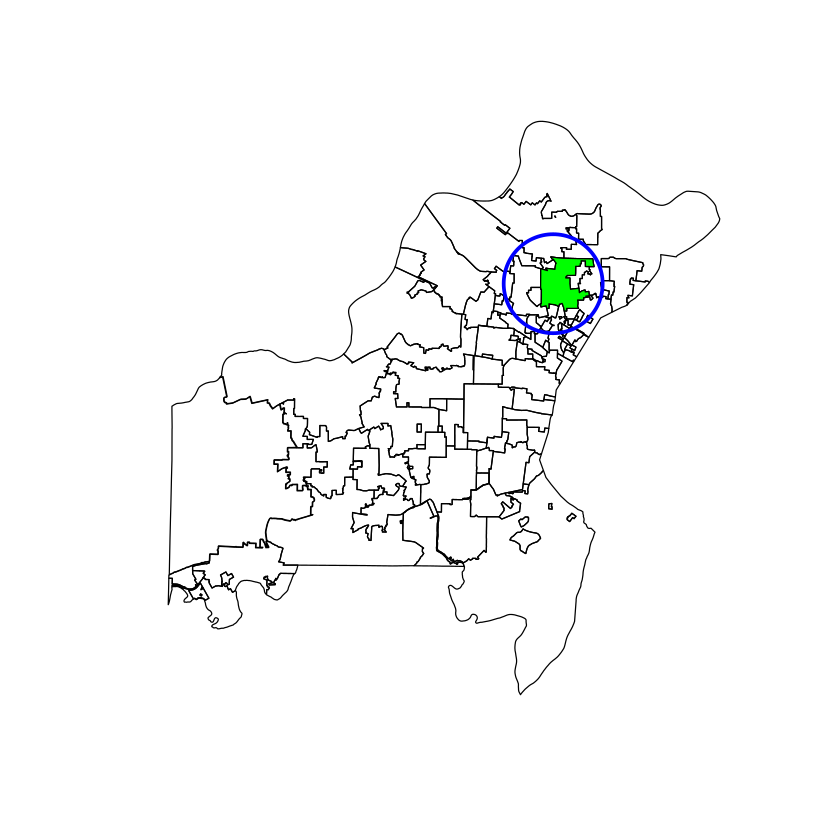

In [15]:
# ============================================================
# Step 2 - 11: Plot with buffer
# ============================================================

ferg_buffer_geog_coords <- st_transform(ferg_buffer, crs = st_crs(stlco))

# Plot the entire shapefile
plot(st_geometry(stlco)) +
  plot(st_geometry(stlco %>% filter(MUNICIPALI == "FERGUSON")), col = "green", add = TRUE) +
  plot(st_geometry(ferg_cent), col = "red", add = TRUE) +
  plot(st_geometry(ferg_buffer_geog_coords), add = TRUE, border = "blue", lwd = 3) # Plot the buffer around Ferguson in blue

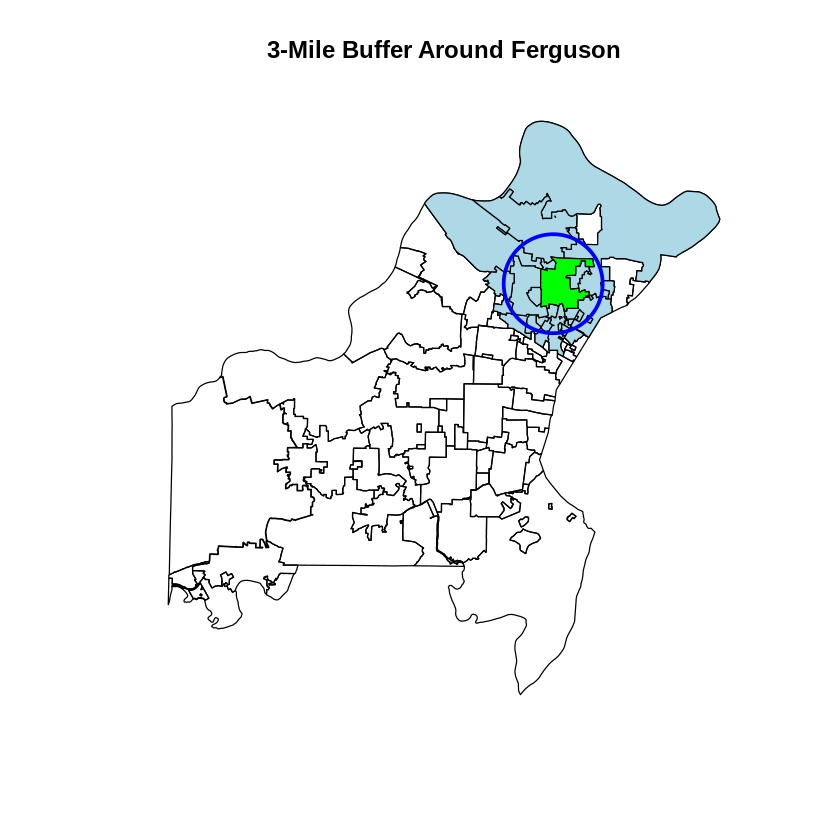

In [19]:

# ============================================================
# Step 2 - 11: Plot with buffer
# Identify areas within the 3-mile buffer around Ferguson
# ============================================================

ferg_3mi <- stlco[ferg_buffer_geog_coords, ]

# Plot the 3-mile buffer and the selected areas within it
plot(st_geometry(stlco), main = "3-Mile Buffer Around Ferguson")
plot(st_geometry(ferg_3mi), col = "lightblue", add = TRUE)
plot(st_geometry(ferg_buffer_geog_coords), add = TRUE, border = "blue", lwd = 3)
plot(st_geometry(stlco %>% filter(MUNICIPALI == "FERGUSON")), col = "green", add = TRUE)
plot(st_geometry(ferg_cent), col = "red", add = TRUE)

### 2.6 Add in basemap with Leaflet
 * Once the St. Louis County Data is converted to geographic coordinates (lat/lon pairs), we can easily display it with Leaflet

* Without the transformation, we just see a plot of the whole earth

In [17]:
# ============================================================
# Step 2 - 12: Leaflet
# Install and load the leaflet package if not already installed
# ============================================================

install.packages("leaflet") # Used for interactive maps (zoomable maps in RStudio Viewer or browser).
install.packages("terra") # handling raster and some vector spatial data
install.packages("htmlwidgets") # provides a framework for creating interactive web visualizations directly from R.

library(terra)
library(leaflet)
library(htmlwidgets)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘lazyeval’, ‘sp’, ‘terra’, ‘crosstalk’, ‘leaflet.providers’, ‘png’, ‘raster’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

terra 1.8.70


Attaching package: ‘terra’


The following object is masked from ‘package:data.table’:

    shift




In [21]:
# ============================================================
# Step 2 - 13: Simplify the geometry and save as HTMl
# ============================================================


ferg3mi_latlon <- st_transform(ferg_3mi, crs = 4326)

# Transform `stlco` to WGS84
stlco_latlon <- st_transform(stlco, crs = 4326)  # EPSG code for WGS84

# Simplify the geometry for easier rendering (only for testing)
stlco_latlon_simple <- st_simplify(stlco_latlon, dTolerance = 0.01)

# Create the leaflet map object
m <- leaflet() %>%
    addTiles() %>%
    addPolygons(data = stlco_latlon, fillColor = "green",
                color = "black", weight = 1) %>%
    addPolygons(data = ferg3mi_latlon, fillColor = "blue",
                color = "black", weight = 1)

# Save map as HTML
htmlwidgets::saveWidget(m, "map.html", selfcontained = TRUE) # the file is saved under the Municipal_Boundaries folder



In [22]:
# ============================================================
# Step 2 - 14: Transform `ferg_3mi` to WGS84 CRS
# ============================================================


# Display both `stlco_latlon` and `ferg3mi_latlon` with customized styling
m2 <- leaflet() %>%
      addTiles() %>%
      addPolygons(data = stlco_latlon, fillColor = "green",
                  highlightOptions = highlightOptions(color = "white", weight = 2,
                                                      bringToFront = TRUE),
                  label = ~MUNICIPALI) %>%
      addPolygons(data = ferg3mi_latlon, fillColor = "blue",
                  highlightOptions = highlightOptions(color = "white", weight = 2,
                                                      bringToFront = TRUE),
                  label = ~MUNICIPALI)

# Save map as HTML
htmlwidgets::saveWidget(m2, "map2.html", selfcontained = TRUE) # the file is saved under the Municipal_Boundaries folder


## [3. Advanced GeoSpatial Analaysis](#advanced)

In this example, we show how to work with shapefile data within R with advanced functions.

* **ggmap** is an R package that makes it easy to retrieve raster map *tiles* from popular online mapping services like Google Maps and Stamen Maps and plot them using the [ggplot2](https://github.com/tidyverse/ggplot2) framework.

* Use `qmplot()` in the same way you’d use `qplot()`, but with a map automatically added in the background. In fact, since **ggmap’s** built on top of **ggplot2**, all your usual **ggplot2** stuff (geoms, polishing, etc.) will work, and there are some unique graphing perks **ggmap** brings to the table, too.

<p>&nbsp;</p>

| Feature | `ggplot2` | `ggmap` |
|----------|------------|---------|
| **Purpose** | Create statistical and analytical plots (scatter, bar, line, etc.) | Create maps with real-world basemap tiles and overlay spatial data |
| **Base Layer** | Blank coordinate grid | Map image (from Google, Stadia, or OpenStreetMap) |
| **Axes** | Any numerical or categorical variables | Longitude (`x`) and Latitude (`y`) |
| **Data Context** | Abstract or tabular data | Geographical / spatial data |
| **Main Function** | `ggplot()` | `ggmap()` |
| **Base Map Retrieval** | Not applicable | `get_stadiamap()`, `get_googlemap()`, `get_map()` |
| **Supports APIs** | ❌ No | ✅ Yes (Google Maps, Stadia Maps, OSM) |
| **Use of Layers** | `geom_point()`, `geom_bar()`, `geom_line()` | Same layers, overlaid on a basemap |
| **Coordinate System** | Cartesian (x–y) | Geographic (longitude–latitude) |
| **Visualization Type** | Statistical graphics | Spatial / map-based visualization |
| **Output Example** | Scatterplot, histogram, boxplot | Static or interactive map with points or polygons |

<p>&nbsp;</p>

| Feature | `qplot()` | `qmplot()` |
|----------|------------|------------|
| **Package** | `ggplot2` | `ggmap` |
| **Purpose** | Quick version of `ggplot()` for fast data plotting | Quick version of `ggmap()` for fast mapping |
| **Base Layer** | Blank plotting grid | Map background (Google, Stadia, or OSM tiles) |
| **Coordinates** | Generic x–y data | Longitude and latitude |
| **Input Example** | `qplot(x = mpg$displ, y = mpg$hwy)` | `qmplot(lon, lat, data = crime, color = offense)` |
| **Fetches Basemap Automatically** | ❌ No | ✅ Yes |
| **API Requirement** | None | May require Stadia or Google API key |
| **Output** | Quick static plot | Quick geographic map with spatial data |
| **Best For** | Rapid exploratory data visualization | Rapid spatial visualization (e.g., crime points on a city map) |



### 3.1 Stadia Maps API

* **Stadia Map services** is a commercial tile hosting service — it provides map `tiles` similar to OpenStreetMap but with: Better performance (CDN-hosted), Custom styles (e.g., stamen_toner, stamen_terrain, stamen_watercolor), and an API key system for reliable access.

* Create an account to activate your own Stadia API using the link: https://client.stadiamaps.com/signup/

In [23]:
# ============================================================
# Step 3 - 1: Download required library
# ============================================================

install.packages("ggmap") # retrieve
library("ggmap")


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘plyr’, ‘jpeg’, ‘bitops’


ℹ Google's Terms of Service: <https://mapsplatform.google.com>
  Stadia Maps' Terms of Service: <https://stadiamaps.com/terms-of-service>
  OpenStreetMap's Tile Usage Policy: <https://operations.osmfoundation.org/policies/tiles>
ℹ Please cite ggmap if you use it! Use `citation("ggmap")` for details.

Attaching package: ‘ggmap’


The following object is masked from ‘package:terra’:

    inset




ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



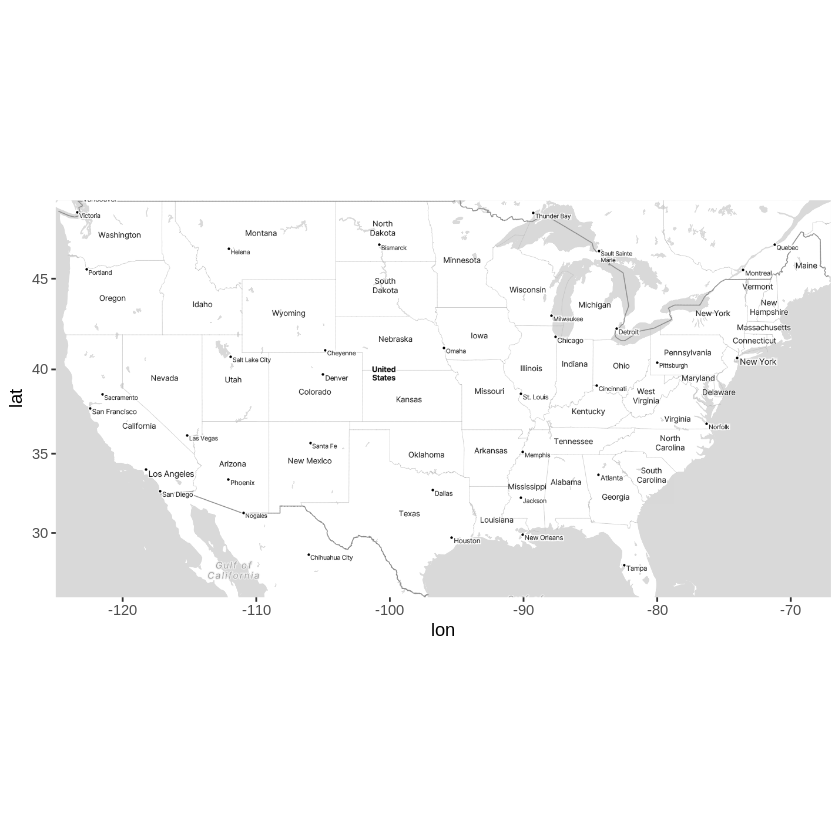

In [ ]:
# ============================================================
# Step 3 - 2: Register Stadia Maps API Key
# ============================================================

# Replace with your actual Stadia Maps API key
register_stadiamaps(key = "<YOUR API>")

# us <- c(left = -125, bottom = 25.75, right = -67, top = 49)
#   Function        : This is a **variable assignment**, not a function call.
#                     It creates a **named numeric vector** in R, where each element
#                     represents a geographical boundary value (west, south, east, north).
#                     Such a bounding box is commonly used to define a map extent or
#                     cropping area for spatial data.
#
#   left, bottom,
#   right, top      : Named numeric values defining the coordinates of a rectangular
#                     geographic bounding box:
#                       - left   → westernmost longitude
#                       - bottom → southernmost latitude
#                       - right  → easternmost longitude
#                       - top    → northernmost latitude
#
#   Returns         : A named numeric vector that can be used in spatial functions
#                     such as `st_crop()`, `ggplot2::coord_sf(xlim, ylim)`, or map
#                     generation to specify geographic limits.
#--------------------------------------------------------------------------------
#   us <- c(left = -125, bottom = 25.75, right = -67, top = 49) :
#                     Defines a bounding box for the **continental United States**.
#                     - Left  (-125)  → approximately the Pacific Coast (west)
#                     - Bottom (25.75) → near the U.S.–Mexico border (south)
#                     - Right (-67)   → Atlantic Coast (east)
#                     - Top   (49)    → U.S.–Canada border (north)
#
#   Returns          : A named vector `us` that stores the coordinates of the U.S. bounding box.
#                      This can be passed to spatial functions (e.g., `st_crop(stlco, us)`)
#                      to limit plots or spatial operations to the U.S. region.

us <- c(left = -125, bottom = 25.75, right = -67, top = 49)

# get_stadiamap(bbox, zoom = NULL, maptype = "stamen_toner", crop = TRUE, color = "color", force = FALSE, ...)
#   Function        : Downloads a **raster basemap** from **Stadia Maps** (a tile-based map service)
#                     for use with the `ggmap` package. It retrieves map tiles within a specified
#                     bounding box and zoom level, returning a map object suitable for plotting
#                     with `ggmap()`.
#
#   bbox            : A numeric vector or list defining the bounding box of the desired map area.
#                     It should have named elements:
#                        - left   → western longitude
#                        - bottom → southern latitude
#                        - right  → eastern longitude
#                        - top    → northern latitude
#                     (e.g., created using `c(left = -125, bottom = 25.75, right = -67, top = 49)`).
#
#   zoom            : Integer specifying the zoom level of the map tiles.
#                     Higher values yield more detailed (closer) maps:
#                        - 1 → world view
#                        - 10 → regional
#                        - 14+ → city or street level
#
#   maptype         : Character string indicating the map style to fetch.
#                     Common options include:
#                        - "stamen_toner"             → high-contrast black and white
#                        - "stamen_toner_background"  → simplified, grayscale background
#                        - "stamen_terrain"           → terrain-style with elevation and labels
#                        - "stamen_watercolor"        → artistic watercolor appearance
#
#   crop            : Logical; if TRUE (default), crops the map to exactly match the bounding box.
#
#   color           : "color" or "bw" (black and white) — controls color rendering.
#
#   force           : Logical; if TRUE, forces map retrieval even if cached data exists.
#
#   Returns         : A raster map object (class `"ggmap"`) containing image data and bounding box info.
#                     This can be directly plotted using `ggmap()` or enhanced with ggplot2 layers.
#--------------------------------------------------------------------------------
#   get_stadiamap(bbox, zoom = 14, maptype = "stamen_toner_background") :
#                     Downloads a grayscale background map (from Stamen via Stadia Maps)
#                     focused on the area defined by `bbox` at zoom level 14.
#
#   bbox             : The bounding box defining the spatial extent of the map region.
#
#   zoom = 14        : Requests a moderately detailed map — typically appropriate for
#                      urban or municipal-scale visualization.
#
#   maptype = "stamen_toner_background" :
#                      Retrieves a clean, minimalist background map useful for overlaying
#                      spatial data such as municipal boundaries or centroid points.
#
#   Returns           : A `"ggmap"` object (`us_map`, for example) that can be visualized
#                       with `ggmap()` and further annotated using `geom_sf()` or other ggplot2 layers.

us_map <- get_stadiamap(us, zoom = 5, maptype = "stamen_toner_lite")


# ggmap(x, extent = "panel", base_layer = NULL, maprange = FALSE, ...)
#   Function        : Plots a map image object retrieved by `get_map()` using **ggplot2** syntax.
#                     The `ggmap()` function from the **ggmap** package renders raster map tiles
#                     (e.g., from Google Maps, Stamen, or OpenStreetMap) as a ggplot layer, allowing
#                     further customization (adding points, paths, polygons, etc.).
#
#   x               : A map object returned by `get_map()` or `get_stamenmap()`.
#                     This object contains raster image data and spatial boundaries.
#
#   extent          : Controls how the map fills the plot area.
#                     Options:
#                       - "panel" (default) → fills only the plotting panel.
#                       - "device"          → extends to the entire plot device.
#
#   base_layer      : (Optional) A ggplot2 object that the map should be added to as a base layer.
#
#   maprange        : Logical; if TRUE, sets the coordinate system limits
#                     to match the bounding box of the map.
#
#   ...             : Additional ggplot2-style parameters for further customization.
#
#   Returns         : A ggplot2 object displaying the map image, which can be extended
#                     with additional layers (e.g., geom_point, geom_polygon, etc.).
#--------------------------------------------------------------------------------
#   ggmap(us_map) :
#                   Displays the map object `us_map`, which was likely created earlier
#                   using `get_map()` with U.S. bounding coordinates or another source.
#                   This function renders the background basemap on which you can overlay
#                   spatial features (such as municipal boundaries or centroids).
#
#   Returns          : A rendered map visualization of `us_map` as a ggplot object.
#                      You can add further layers like:
#                          + geom_sf(data = stlco, fill = "lightblue")
#                          + geom_point(data = centroids, color = "red")

ggmap(us_map)

In [25]:
# ============================================================
# Step 3 - 3: Download other required libraries
# ============================================================

install.packages("forcats") # required for fct_drop() and fct_relevel
library("forcats")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



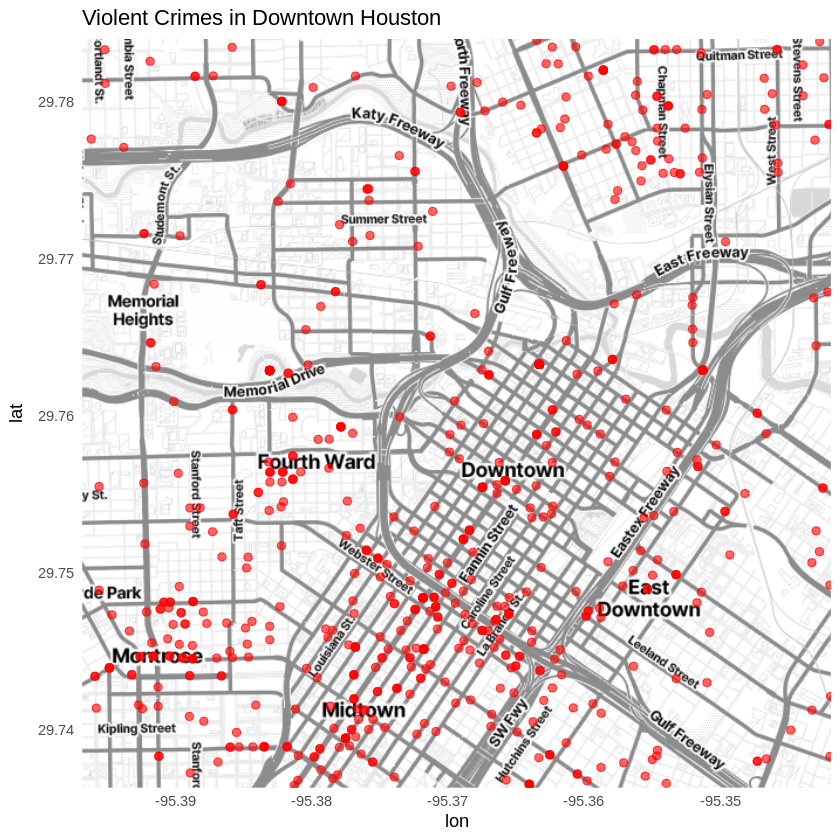

In [26]:
# ============================================================
# Step 3 - 4: Register Stadia Maps API Key
# ============================================================

# define helper
`%notin%` <- function(lhs, rhs) !(lhs %in% rhs)

# reduce crime to violent crimes in downtown houston
violent_crimes <- crime %>%
                  filter(
                    offense %notin% c("auto theft", "theft", "burglary"),
                    between(lon, -95.39681, -95.34188),
                    between(lat, 29.73631, 29.78400)
                  ) %>%
                  mutate(
                    offense = fct_drop(offense), # Removes unused factor levels (the excluded offenses like “auto theft” remain as empty levels unless dropped).
                    offense = fct_relevel(offense, c("robbery", "aggravated assault", "rape", "murder")) # Reorders the remaining offense categories into a meaningful order:
                  )


# use qmplot to make a scatterplot on a map
# these values define a small rectangular area located in Houston, Texas (downtown region).
bbox <- c(left = -95.39681, bottom = 29.73631, right = -95.34188, top = 29.78400)
houston_map <- get_stadiamap(bbox, zoom = 14, maptype = "stamen_toner_lite")

# Plot with ggmap + geom_point
ggmap(houston_map) +
  geom_point(
    data = violent_crimes,
    aes(x = lon, y = lat),
    color = "red", alpha = 0.6, size = 2
  ) +
  labs(title = "Violent Crimes in Downtown Houston") +
  theme_minimal()

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


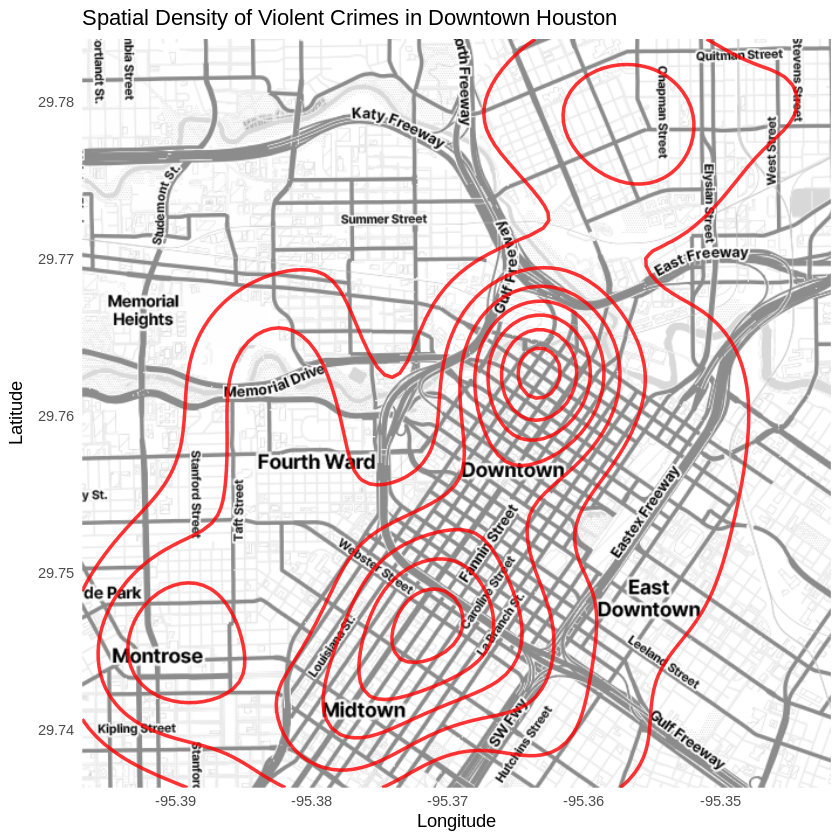

In [27]:
# ============================================================
# Step 3 - 5: Plot density contours over map
# ============================================================

ggmap(houston_map) +
  stat_density2d(
    data = violent_crimes,
    aes(x = lon, y = lat),
    color = "red",
    size = 1,
    alpha = 0.8
  ) +
  labs(
    title = "Spatial Density of Violent Crimes in Downtown Houston",
    x = "Longitude", y = "Latitude"
  ) +
  theme_minimal()

In [28]:
# ============================================================
# Step 3 - 6: Download other required libraries
# ============================================================

install.packages("ggdensity") # to create high-quality density plots, probability contours, and HDR (Highest Density Region) plots in 2D space.
install.packages("geomtextpath") # to add text labels that follow paths, curves, or contour lines (instead of floating labels that overlap the plot).
library("ggdensity")
library("geomtextpath")


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [29]:
# ============================================================
# Step 3 - 6: Filter only robberies and define bounding box
# ============================================================


robberies <- violent_crimes %>% filter(offense == "robbery")


bbox <- c(left = -95.39681, bottom = 29.73631, right = -95.34188, top = 29.78400)
houston_map <- get_stadiamap(bbox, zoom = 14, maptype = "stamen_toner_background")


ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



Warning message in geom_labeldensity2d(data = robberies, aes(x = lon, y = lat, level = stat(probs)), :
“Ignoring unknown parameters: `contour`, `contour_var`, `h`, and `adjust`”
Warning message in geom_labeldensity2d(data = robberies, aes(x = lon, y = lat, level = stat(probs)), :
“Ignoring unknown aesthetics: level”
Warning message:
“`stat(probs)` was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(probs)` instead.
ℹ The deprecated feature was likely used in the ggmap package.
  Please report the issue at <https://github.com/dkahle/ggmap/issues>.”
Warning message:
“The text offset exceeds the curvature in one or more paths. This will result in
displaced letters. Consider reducing the vjust or text size, or use the hjust
parameter to move the string to a different point on the path.”


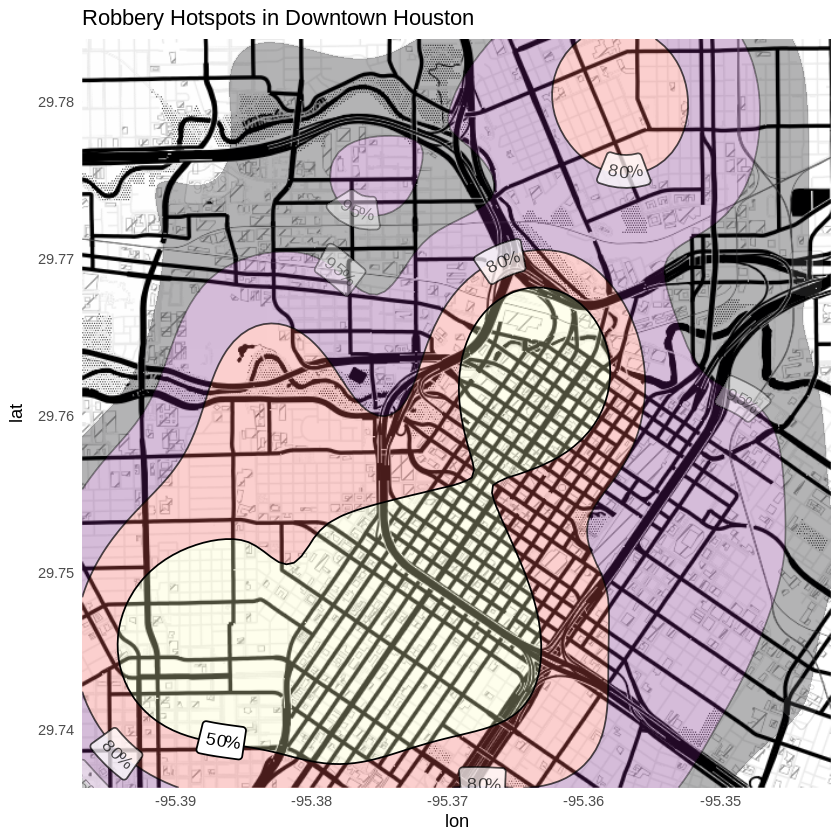

In [30]:
# ============================================================
# Step 3 - 7: Plot with ggmap + HDR density visualization
# ============================================================


ggmap(houston_map) +
  geom_hdr(
            data = robberies,
            aes(x = lon, y = lat, fill = stat(probs)),
            alpha = 0.3
          ) +
  geom_labeldensity2d(
                        data = robberies,
                        aes(x = lon, y = lat, level = stat(probs)),
                        stat = "hdr_lines",
                        color = "black"
                      ) +
    scale_fill_viridis_d(option = "A") +
    theme_minimal() +
    theme(legend.position = "none") +
    labs(title = "Robbery Hotspots in Downtown Houston")

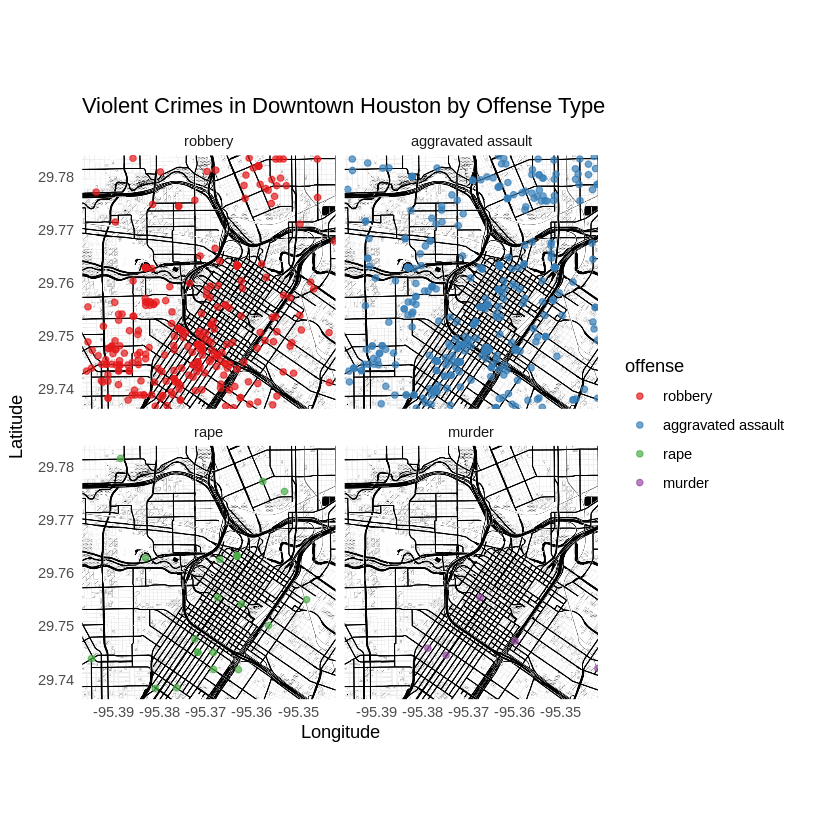

In [31]:
# ============================================================
# Step 3 - 8: faceting visualization
# ============================================================

ggmap(houston_map) +
  geom_point(
              data = violent_crimes,
              aes(x = lon, y = lat, color = offense),
              alpha = 0.7, size = 1.5
            ) +
  facet_wrap(~ offense) +
  scale_color_brewer(palette = "Set1") +
  labs(
        title = "Violent Crimes in Downtown Houston by Offense Type",
        x = "Longitude", y = "Latitude"
      ) +
  theme_minimal()

### 3.2 Google Maps API key

A few years ago Google has [changed its API requirements](https://developers.google.com/maps/documentation/geocoding/usage-and-billing), and **ggmap** users are now required to register with Google. From a user’s perspective, there are essentially three ramifications of this:

1. Users must register with Google. You can do this at [https://mapsplatform.google.com/](https://mapsplatform.google.com). While it will require a valid credit card (sorry!), there seems to be a fair bit of free use before you incur charges, and even then the charges are modest for light use.

2. Users must enable the APIs they intend to use. What may appear to **ggmap** users as one overarching “Google Maps” product, Google in fact has several services that it provides as geo-related solutions. For example, the [Maps Static API](https://developers.google.com/maps/documentation/maps-static/intro) provides map images, while the [Geocoding API](https://developers.google.com/maps/documentation/geocoding/intro) provides geocoding and reverse geocoding services. Apart from the relevant Terms of Service, generally **ggmap** users don’t need to think about the different services. For example, you just need to remember that `get_googlemap()` gets maps, `geocode()` geocodes (with Google, DSK is done), etc., and **ggmap** handles the queries for you. However, you do need to enable the APIs before you use them. You’ll only need to do that once, and then they’ll be ready for you to use. Enabling the APIs just means clicking a few radio buttons on the Google Maps Platform web interface listed above, so it’s easy.

3. Inside R, after loading the new version of **ggmap**, you’ll need provide **ggmap** with your API key, a [hash value](https://en.wikipedia.org/wiki/Hash_function) (think string of jibberish) that authenticates you to Google’s servers. This can be done on a temporary basis with `register_google(key = "[your key]")` or permanently using `register_google(key = "[your key]"`, write = TRUE) (note: this will overwrite your `~/.Renviron` file by replacing/adding the relevant line). If you use the former, know that you’ll need to re-do it every time you reset R.

    * Google’s geocoding and reverse geocoding API’s are available through `geocode()` and `revgeocode()`, respectively.
    * There is also a `mutate_geocode()` that works similarly to [dplyr’s](https://github.com/hadley/dplyr) `mutate()` function.
    * Treks use Google’s routing API to give you routes (`route()` and `trek()` give slightly different results; the latter hugs roads).


[Google Maps](http://developers.google.com/maps/terms) can be used just as easily. However, since Google Maps use a center/zoom specification, their input is a bit different.


    * You can use your google account to get the Google Maps API key here: https://console.cloud.google.com/


ℹ Creating file /root/.Renviron

ℹ Adding key to /root/.Renviron

ℹ <https://maps.googleapis.com/maps/api/staticmap?center=waco%20texas&zoom=12&size=640x640&scale=2&maptype=terrain&key=xxx-17am7o>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=waco+texas&key=xxx-17am7o>

1280x1280 terrain map image from Google Maps; use `ggmap::ggmap()` to plot it.



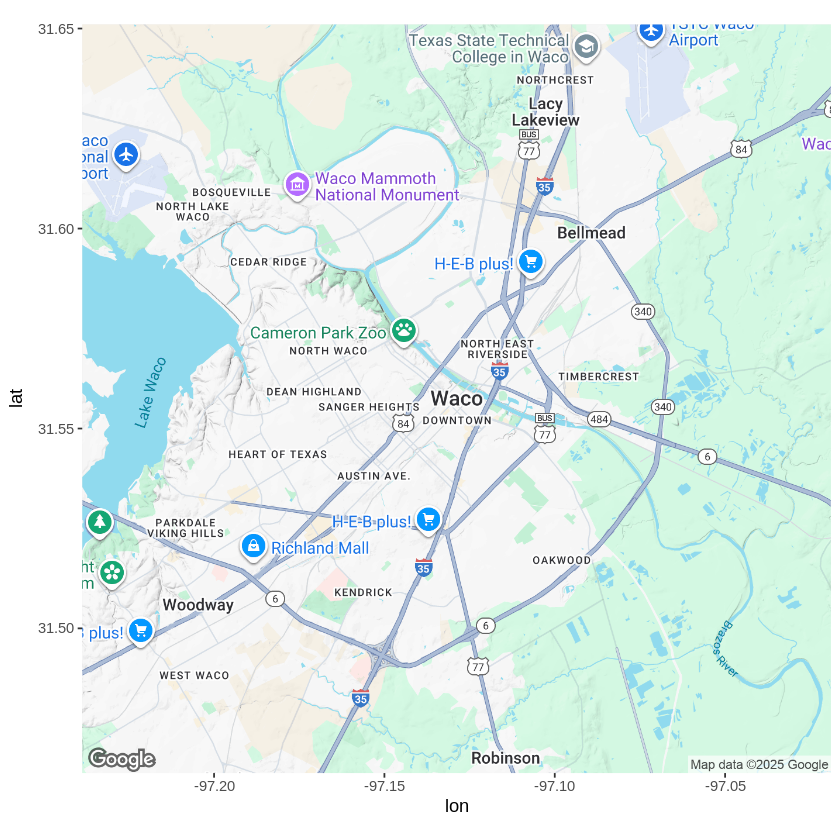

In [ ]:
# ============================================================
# Step 3 - 9: Register google map API
# ============================================================

ggmap::register_google(key = '<YOUR API>', write = TRUE)
(map <- get_googlemap("waco texas", zoom = 12))
ggmap(map)

ℹ <https://maps.googleapis.com/maps/api/staticmap?center=waco%20texas&zoom=12&size=640x640&scale=2&maptype=satellite&key=xxx-17am7o>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=waco+texas&key=xxx-17am7o>

ℹ <https://maps.googleapis.com/maps/api/staticmap?center=waco%20texas&zoom=12&size=640x640&scale=2&maptype=hybrid&key=xxx-17am7o>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=waco+texas&key=xxx-17am7o>



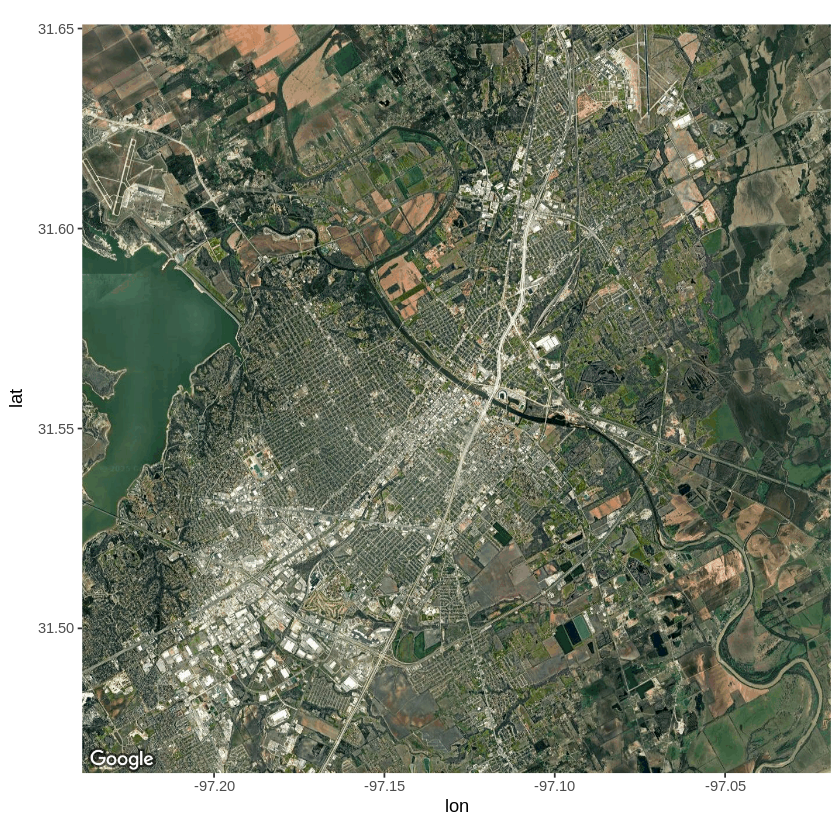

ℹ <https://maps.googleapis.com/maps/api/staticmap?center=waco%20texas&zoom=12&size=640x640&scale=2&maptype=roadmap&key=xxx-17am7o>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=waco+texas&key=xxx-17am7o>



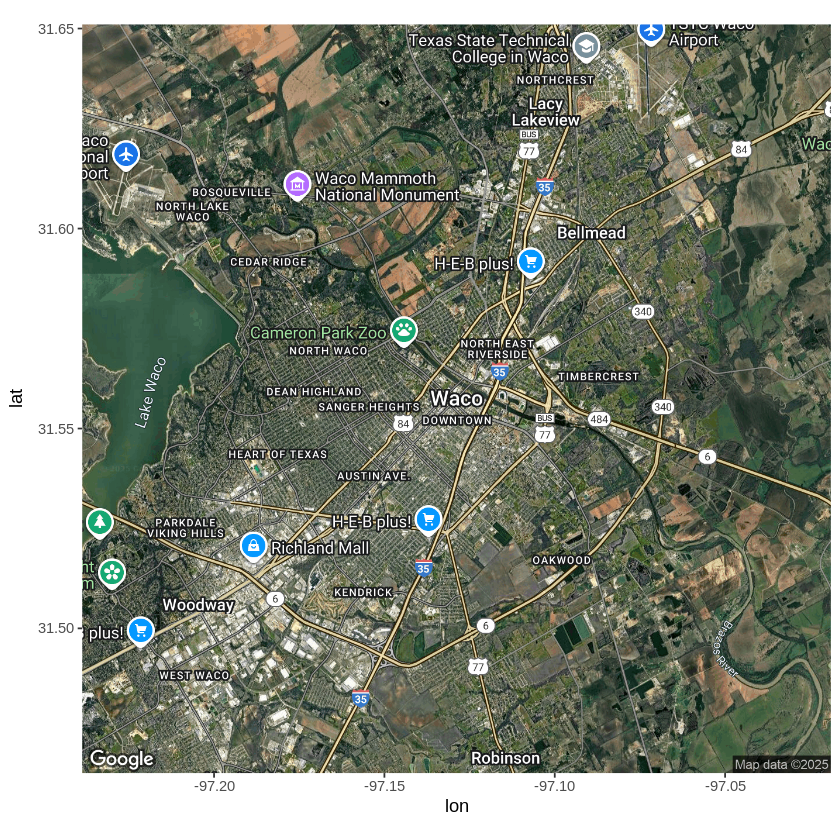

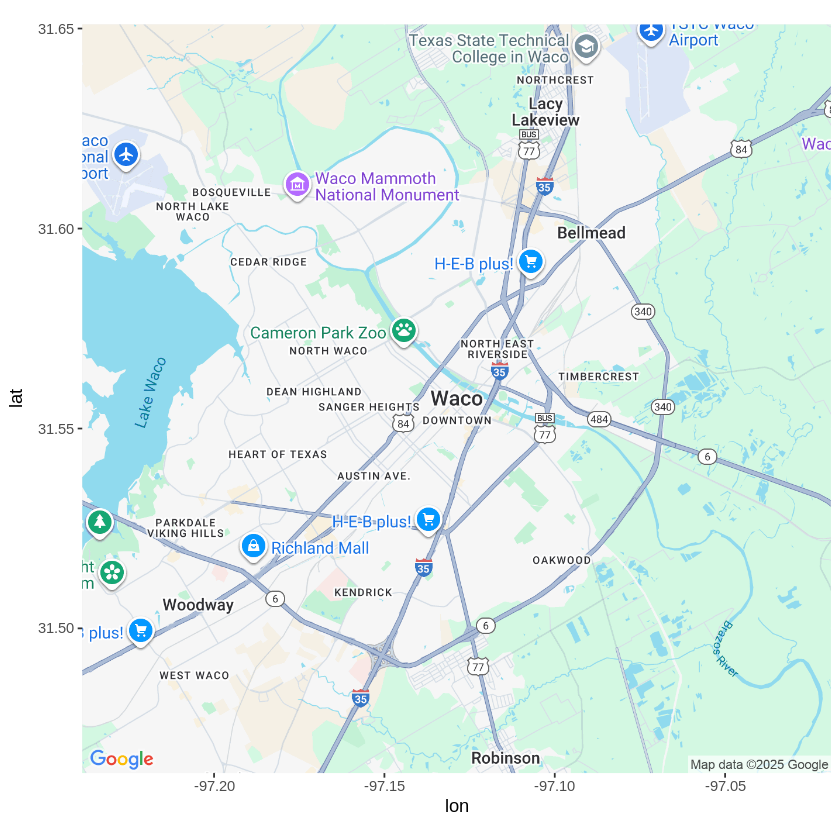

In [33]:
# ============================================================
# Step 3 - 10: Get various different sytles of Google Maps with ggmap
# ============================================================

# v1
get_googlemap("waco texas", zoom = 12, maptype = "satellite") %>% ggmap()

# v2
get_googlemap("waco texas", zoom = 12, maptype = "hybrid") %>% ggmap()

# v3
get_googlemap("waco texas", zoom = 12, maptype = "roadmap") %>% ggmap()

In [34]:
# ============================================================
# Step 3 - 11: Google’s geocoding and reverse geocoding API’s
# ============================================================

geocode("1301 S University Parks Dr, Waco, TX 76798")

revgeocode(c(lon = -97.1161, lat = 31.55098))

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=1301+S+University+Parks+Dr,+Waco,+TX+76798&key=xxx-17am7o>



lon,lat
<dbl>,<dbl>
-97.11606,31.55101


ℹ <https://maps.googleapis.com/maps/api/geocode/json?latlng=31.55098,-97.1161&key=xxx-17am7o>

Warning message:
“Multiple addresses found, the first will be returned:”
!   1301 S University Parks Dr, Waco, TX 76706, USA

!   55 Baylor Ave, Waco, TX 76706, USA

!   1437 S University Parks Dr, Waco, TX 76706, USA

!   HV2M+9H Waco, TX, USA

!   Bear Trail, Waco, TX 76706, USA

!   Waco, TX 76706, USA

!   Waco, TX, USA

!   McLennan County, TX, USA

!   Texas, USA

!   United States



[1] "1301 S University Parks Dr, Waco, TX 76706, USA"

In [35]:
# ============================================================
# Step 3 - 12: mutate_geocode() that works similarly to dplyr’s mutate() function:
# ============================================================

tibble(address = c("white house", "", "waco texas")) %>%
  mutate_geocode(address)

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=white+house&key=xxx-17am7o>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=waco+texas&key=xxx-17am7o>



address,lon,lat
<chr>,<dbl>,<dbl>
white house,-77.03653,38.89768
,NA,NA
waco texas,-97.12899,31.55759


ℹ <https://maps.googleapis.com/maps/api/directions/json?origin=houson,+texas&destination=waco,+texas&key=xxx-17am7o&mode=driving&alternatives=false&units=metric>

ℹ <https://maps.googleapis.com/maps/api/staticmap?center=college%20station,%20texas&zoom=8&size=640x640&scale=2&maptype=terrain&language=en-EN&key=xxx-17am7o>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=college+station,+texas&key=xxx-17am7o>



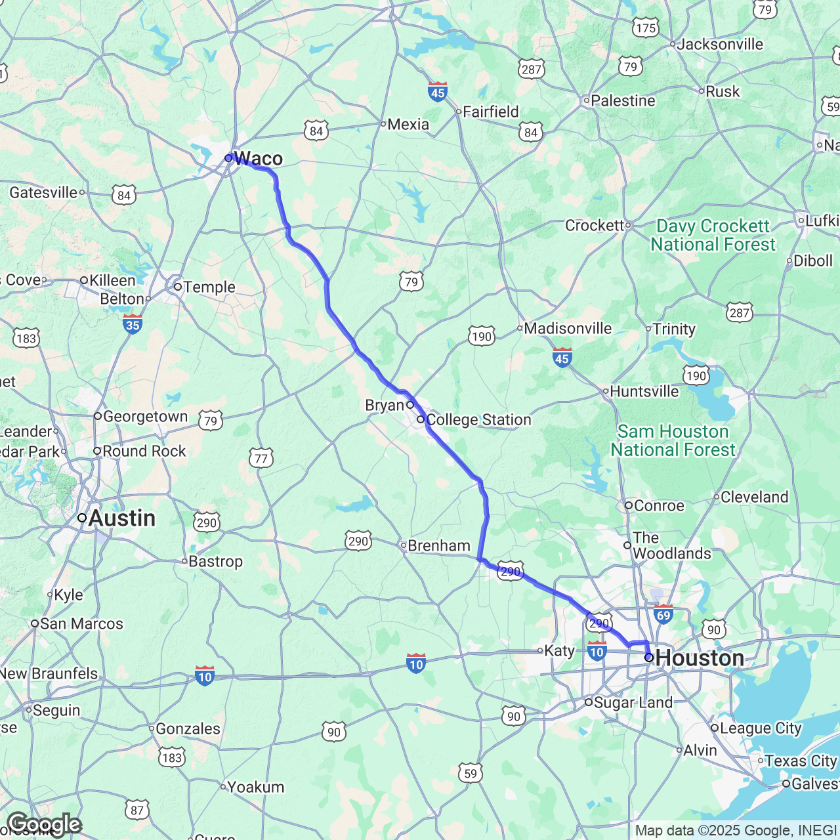

In [36]:
# ============================================================
# Step 3 - 13: Treks use Google’s routing API to give you routes (route() and trek() give slightly different results; the latter hugs roads):
# ============================================================
trek_df <- trek("houson, texas", "waco, texas", structure = "route")
qmap("college station, texas", zoom = 8) +
  geom_path(
    aes(x = lon, y = lat),  colour = "blue",
    size = 1.5, alpha = .5,
    data = trek_df, lineend = "round"
  )

Your API key is private and unique to you, so be careful not to share it online, for example in a GitHub issue or saving it in a shared R script file. If you share it inadvertantly, just get on Google’s website and regenerate your key - this will retire the old one. Keeping your key private is made a bit easier by **ggmap** scrubbing the key out of queries by default, so when URLs are shown in your console, they’ll look something like `key=xxx`. (Read the details section of the `register_google()` documentation for a bit more info on this point.)

The new version of **ggmap** is now on CRAN soon, but you can install the latest version, including an important bug fix in `mapdist()`, here with: